In [1]:
from pathlib import Path

from IPython.display import HTML

from gemdat import Jumps, Transitions, Trajectory, plots
from gemdat.io import load_known_material

from gemdat.utils import VASPRUN

/home/stef/python/gemdat/.venv/lib64/python3.12/site-packages/MDAnalysis/topology/TPRParser.py:161: DeprecationWarning: 'xdrlib' is deprecated and slated for removal in Python 3.13
  import xdrlib


In [2]:
trajectory = Trajectory.from_vasprun(VASPRUN)gemdat
trajectory.lattice

array([[ 1.98731791e+01,  6.20810000e-03, -1.47329780e-01],
       [ 5.31820000e-03,  9.91942326e+00, -2.12572900e-02],
       [-7.51747000e-02, -1.57671800e-02,  9.91615613e+00]])

In [3]:
fig = plots.displacement_per_element(trajectory=trajectory)
HTML(fig.to_html())

In [4]:
# Create a new trajectory object that only consists of Lithium
diff_trajectory = trajectory.filter('Li')

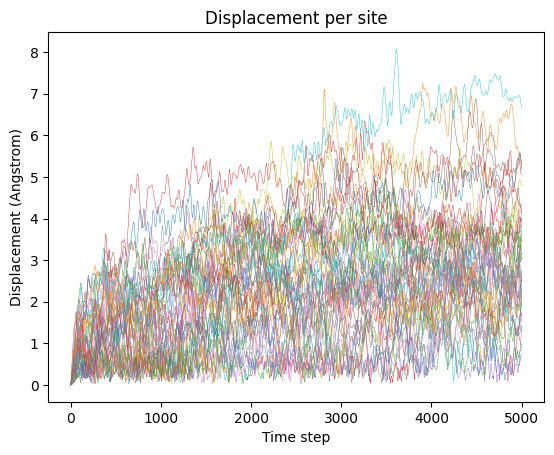

In [5]:
plots.displacement_per_site(trajectory=diff_trajectory);

In [6]:
fig = plots.displacement_histogram(trajectory=diff_trajectory)
HTML(fig.to_html())

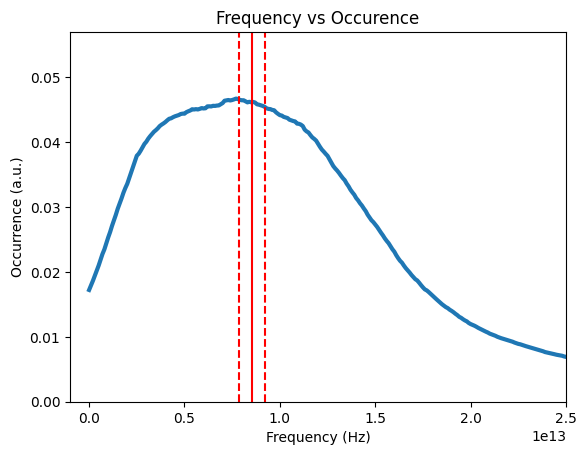

In [7]:
plots.frequency_vs_occurence(trajectory=diff_trajectory);

In [8]:
fig = plots.vibrational_amplitudes(trajectory=diff_trajectory)
HTML(fig.to_html())

Further analysis can be done by loading a known material and creating sites from it for the simulation data.
There are multiple possibilities here, like loading a CIF file or from a [small internal database of known materials](https://github.com/GEMDAT-repos/GEMDAT/tree/main/src/gemdat/data).

In [9]:
sites = load_known_material('argyrodite', supercell=(2, 1, 1))
sites[0:10]

[PeriodicSite: 48h (Li) (1.816, 1.816, 0.2382) [0.0915, 0.183, 0.024],
 PeriodicSite: 48h (Li) (11.74, 1.816, 0.2382) [0.5915, 0.183, 0.024],
 PeriodicSite: 48h (Li) (1.816, 6.778, 5.2) [0.0915, 0.683, 0.524],
 PeriodicSite: 48h (Li) (11.74, 6.778, 5.2) [0.5915, 0.683, 0.524],
 PeriodicSite: 48h (Li) (6.778, 1.816, 5.2) [0.3415, 0.183, 0.524],
 PeriodicSite: 48h (Li) (16.7, 1.816, 5.2) [0.8415, 0.183, 0.524],
 PeriodicSite: 48h (Li) (6.778, 6.778, 0.2382) [0.3415, 0.683, 0.024],
 PeriodicSite: 48h (Li) (16.7, 6.778, 0.2382) [0.8415, 0.683, 0.024],
 PeriodicSite: 48h (Li) (9.686, 1.816, 8.108) [0.488, 0.183, 0.817],
 PeriodicSite: 48h (Li) (19.61, 1.816, 8.108) [0.988, 0.183, 0.817]]

Transitions and jumps can be generated from the trajectory and the sites that the diffusing species jump between.

In [10]:
transitions = trajectory.transitions_between_sites(sites=sites, floating_specie='Li')
jumps = Jumps(transitions=transitions, minimal_residence=0)

In [11]:
transitions.occupancy()

Structure Summary
Lattice
    abc : 19.848 9.924 9.924
 angles : 90.0 90.0 90.0
 volume : 1954.7456820479997
      A : 19.848 0.0 1.2153394834738332e-15
      B : 1.5959009175390938e-15 9.924 6.076697417369166e-16
      C : 0.0 0.0 9.924
    pbc : True True True
PeriodicSite: 48h (Li:0.424) (1.816, 1.816, 0.2382) [0.0915, 0.183, 0.024]
PeriodicSite: 48h (Li:0.337) (11.74, 1.816, 0.2382) [0.5915, 0.183, 0.024]
PeriodicSite: 48h (Li:0.362) (1.816, 6.778, 5.2) [0.0915, 0.683, 0.524]
PeriodicSite: 48h (Li:0.413) (11.74, 6.778, 5.2) [0.5915, 0.683, 0.524]
PeriodicSite: 48h (Li:0.475) (6.778, 1.816, 5.2) [0.3415, 0.183, 0.524]
PeriodicSite: 48h (Li:0.661) (16.7, 1.816, 5.2) [0.8415, 0.183, 0.524]
PeriodicSite: 48h (Li:0.323) (6.778, 6.778, 0.2382) [0.3415, 0.683, 0.024]
PeriodicSite: 48h (Li:0.363) (16.7, 6.778, 0.2382) [0.8415, 0.683, 0.024]
PeriodicSite: 48h (Li:0.528) (9.686, 1.816, 8.108) [0.488, 0.183, 0.817]
PeriodicSite: 48h (Li:0.278) (19.61, 1.816, 8.108) [0.988, 0.183, 0.817]
Perio

In [12]:
fig = plots.jumps_vs_distance(jumps=jumps)
HTML(fig.to_html())

In [13]:
fig = plots.jumps_vs_time(jumps=jumps)
HTML(fig.to_html())

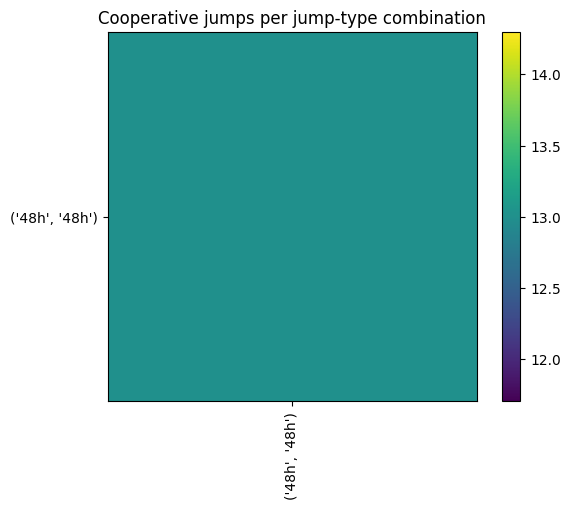

In [14]:
plots.collective_jumps(jumps=jumps);

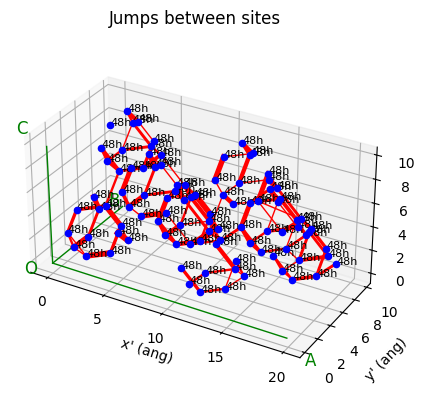

In [15]:
plots.jumps_3d(jumps=jumps);